<table align="center" width=100%>
    <tr>
        <td width="15%">
            <img src="travel_review.png">
        </td>
        <td>
            <div align="center">
                <font color="#21618C" size=24px>
                    <b> Travel Reviews Clustering
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

## Context:
This data set is populated by capturing user ratings from Google reviews. Reviews on attractions from 24 categories across Europe are considered. Google user rating ranges from 1 to 5 and average user rating per category is calculated.

## Data Definition:

Input variables:

1) **User** Unique user id 


2) **Attribute 1:** Average ratings on churches 


3) **Attribute 2:** Average ratings on resorts  


4) **Attribute 3:** Average ratings on beaches  


5) **Attribute 4:** Average ratings on parks  


6) **Attribute 5:** Average ratings on theatres  


7) **Attribute 6:** Average ratings on museums  


8) **Attribute 7:** Average ratings on malls  


9) **Attribute 8:** Average ratings on zoo  


10) **Attribute 9:** Average ratings on restaurants  


11) **Attribute 10:** Average ratings on pubs/bars  


12) **Attribute 11:** Average ratings on local services  


13) **Attribute 12:** Average ratings on burger/pizza shops  


14) **Attribute 13:** Average ratings on hotels/other lodgings  


15) **Attribute 14:** Average ratings on juice bars  


16) **Attribute 15:** Average ratings on art galleries 


17) **Attribute 16:** Average ratings on dance clubs  


18) **Attribute 17:** Average ratings on swimming pools  


19) **Attribute 18:** Average ratings on gyms  


20) **Attribute 19:** Average ratings on bakeries  


21) **Attribute 20:** Average ratings on beauty & spas  


22) **Attribute 21:** Average ratings on cafes  


23) **Attribute 22:** Average ratings on view points  


24) **Attribute 23:** Average ratings on monuments  


25) **Attribute 24:** Average ratings on gardens 




1. **[Import Packages](#import_packages)**
2. **[Read Data](#Read_Data)**
3. **[Data Types and Dimensions](#Data_Types)**
4. **[Data Manipulation](#Data_Manipulation)**
5. **[Statistical Summary](#Statistical_Summary)**    
6. **[Handling Missing Values](#Handling_Missing_Values)**    
7. **[Exploratory Data Analysis](#Exploratory_Data_Analysis)**   
8. **[Hierarchical Clustering](#Hierarchical_Clustering)**
9. **[Conclusion](#Conclusion)**  

<a id='import_packages'></a>
## 1. Import Packages

In [2]:
# suppress warnings 
from warnings import filterwarnings
filterwarnings('ignore')

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Set default setting of seaborn
sns.set()

In [4]:
# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = 50 # None

# returns an output value upto 6 decimals
pd.options.display.float_format = '{:.6f}'.format

<a id='Read_Data'></a>
## 2. Read the Data

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>Read the data using read_csv() function from pandas<br> 
                </font>
            </div>
        </td>
    </tr>
</table>

In [5]:
# read the data
raw_data = pd.read_csv('../Dataset/google_review_ratings.csv')

# print the first five rows of the data
raw_data.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,Category 11,Category 12,Category 13,Category 14,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
1,User 2,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.640000,2.330000,2.650000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
2,User 3,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
3,User 4,0.000000,0.500000,3.630000,3.630000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.73,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
4,User 5,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN


<a id='Data_Types'></a>
## 3. Data Types and Dimensions

In [6]:
# check the data types for variables
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User         5456 non-null   object 
 1   Category 1   5456 non-null   float64
 2   Category 2   5456 non-null   float64
 3   Category 3   5456 non-null   float64
 4   Category 4   5456 non-null   float64
 5   Category 5   5456 non-null   float64
 6   Category 6   5456 non-null   float64
 7   Category 7   5456 non-null   float64
 8   Category 8   5456 non-null   float64
 9   Category 9   5456 non-null   float64
 10  Category 10  5456 non-null   float64
 11  Category 11  5456 non-null   object 
 12  Category 12  5455 non-null   float64
 13  Category 13  5456 non-null   float64
 14  Category 14  5456 non-null   float64
 15  Category 15  5456 non-null   float64
 16  Category 16  5456 non-null   float64
 17  Category 17  5456 non-null   float64
 18  Category 18  5456 non-null   float64
 19  Catego

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>Features that are named as Categories, so we need to rename category with it respective label. Also We will drop 'Unnamed: 25' feature as it is redundant</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Before manipulation of data, let's check dimension of dataset**

In [7]:
# get the shape
print(raw_data.shape)

(5456, 26)


**We see that dataframe has 5456 instances and 26 features**

<a id='Data_Manipulation'></a>
## 4. Data Manipulation
Here we will change features names and remove redundant feature

**Droping redundant feature**

In [8]:
# Using drop() function to remove redundant feature
data = raw_data.drop(['Unnamed: 25'] ,axis = 1)
data.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,Category 11,Category 12,Category 13,Category 14,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
0,User 1,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
1,User 2,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.640000,2.330000,2.650000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
2,User 3,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
3,User 4,0.000000,0.500000,3.630000,3.630000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.73,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
4,User 5,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000


**Renaming features**

To perform the action we will create list containing actual names of features

In [9]:
column_names = ['user_id', 'churches', 'resorts', 'beaches', 'parks', 
                'theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens']


Applying above columns names to dataframe columns

In [10]:
data.columns = column_names

Checking if changes are applied or not

In [11]:
data.head()

,user_id,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
0,User 1,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
1,User 2,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.640000,2.330000,2.650000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
2,User 3,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
3,User 4,0.000000,0.500000,3.630000,3.630000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.73,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
4,User 5,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.7,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000


Columns are renamed

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5456 non-null   object 
 1   churches               5456 non-null   float64
 2   resorts                5456 non-null   float64
 3   beaches                5456 non-null   float64
 4   parks                  5456 non-null   float64
 5   theatres               5456 non-null   float64
 6   museums                5456 non-null   float64
 7   malls                  5456 non-null   float64
 8   zoo                    5456 non-null   float64
 9   restaurants            5456 non-null   float64
 10  pubs_bars              5456 non-null   float64
 11  local_services         5456 non-null   object 
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5456 non-null   float64
 14  juice_bars             5456 non-null   float64
 15  art_

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>Since local_services is numeric, it is represented as categorical</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Changing data type of local_services**

In [13]:
## Error

data[['local_services']] = data[['local_services']].apply(pd.to_numeric) 

ValueError: Unable to parse string "2	2." at position 2712

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>We have encountered an error specifying that features have a invalid string. So to change data type we need to release this error</b>
                </font>
            </div>
        </td>
    </tr>
</table>

In [14]:
data['local_services'].unique() # Getting all unique values

array(['1.7', '1.73', '1.71', '1.69', '1.67', '1.65', '1.66', '1.64',
       '1.63', '5', '1.56', '1.55', '1.53', '1.52', '1.51', '1.5', '1.49',
       '1.48', '1.46', '2.13', '2.12', '2.1', '2.09', '2.08', '2.07',
       '2.06', '2.05', '2.04', '2.03', '2.01', '2', '1.98', '1.97',
       '1.95', '1.93', '1.91', '1.9', '1.88', '1.86', '1.84', '1.83',
       '1.81', '1.79', '1.77', '1.74', '1.72', '1.68', '1.61', '1.6',
       '1.59', '1.58', '1.99', '2.47', '2.35', '2.48', '2.59', '3.39',
       '2.31', '2.78', '2.79', '2.77', '2.76', '2.75', '2.74', '2.72',
       '2.71', '2.69', '2.68', '2.66', '2.65', '2.63', '2.61', '2.57',
       '2.55', '2.53', '2.51', '2.49', '1.94', '1.92', '1.82', '1.76',
       '1.62', '4.08', '4.04', '4.02', '4.01', '4', '3.99', '3.98',
       '3.96', '3.95', '3.94', '3.93', '3.91', '3.9', '3.88', '3.87',
       '3.86', '3.84', '3.85', '2.17', '3', '2.99', '2.82', '2.83',
       '2.81', '2.8', '2.73', '2.67', '2.64', '2.62', '2.54', '2.52',
       '2.5', '2.

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>There is a data as '2\t2.' which cannot be converted to float. So need to remove it</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Drop rows where local_services is equal to '2\t2.'**

In [15]:
# Get row number where local services is invalid
data[data['local_services'] == '2\t2.']['local_services']

2712    2\t2.
Name: local_services, dtype: object

Droping row 2712

In [16]:
data = data.drop(data[data['local_services'] == '2\t2.'].index)

Now, we can changing data type of local_services

In [17]:
data[['local_services']] = data[['local_services']].apply(pd.to_numeric) 

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5455 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                5455 non-null   object 
 1   churches               5455 non-null   float64
 2   resorts                5455 non-null   float64
 3   beaches                5455 non-null   float64
 4   parks                  5455 non-null   float64
 5   theatres               5455 non-null   float64
 6   museums                5455 non-null   float64
 7   malls                  5455 non-null   float64
 8   zoo                    5455 non-null   float64
 9   restaurants            5455 non-null   float64
 10  pubs_bars              5455 non-null   float64
 11  local_services         5455 non-null   float64
 12  burger_pizza_shops     5455 non-null   float64
 13  hotels_other_lodgings  5455 non-null   float64
 14  juice_bars             5455 non-null   float64
 15  art_

All the features are numeric except the user_id as it is categorical in nature 

In [19]:
data_manipulated = data.copy(deep =True ) # Creating a copy of dataframe

<a id='Statistical_Summary'></a>
## 5. Statistical Summary


In [20]:
# data frame with numerical features
data_manipulated.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
count,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5455.000000,5454.000000
mean,1.455674,2.319824,2.489520,2.797192,2.959278,2.893809,3.351778,2.541047,3.126301,2.833093,2.550071,2.078339,2.125747,2.190346,2.206060,1.192821,0.949175,0.822374,0.969072,0.999443,0.965098,1.749941,1.530818,1.560570
std,0.827673,1.421542,1.247852,1.309084,1.338948,1.282301,1.413338,1.111338,1.356767,1.307509,1.381769,1.249208,1.406563,1.576372,1.715701,1.107105,0.973623,0.947993,1.202844,1.193097,0.928332,1.598275,1.316172,1.171784
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,0.780000,0.780000,0.770000,0.760000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,1.580000,1.290000,1.190000,1.030000,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,2.000000,1.690000,1.610000,1.490000,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.685000,2.740000,4.095000,4.315000,3.840000,5.000000,3.190000,5.000000,3.530000,3.220000,2.285000,2.360000,2.740000,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>The above output illustrates the summary statistics of all the numeric variables like the mean, median(50%), minimum, and maximum values, along with the standard deviation.</b>     </font>
            </div>
        </td>
    </tr>
</table>

In [21]:
# data frame with categorical features
data.describe(include='object')

,user_id
count,5455
unique,5455
top,User 1
freq,1


<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>user_id is unique for all instances</b>     </font>
            </div>
        </td>
    </tr>
</table>

<a id='Handling_Missing_Values'></a>
## 6. Handling Missing Values
If the missing values are not handled properly we may end up drawing an inaccurate inference about the data. Due to improper handling, the result obtained will differ from the ones where the missing values are present.

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>In order to get the count of missing values in each column, we use the in-built function .isnull().sum()
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

In [22]:
# get the count of missing values
missing_values = data_manipulated.isnull().sum()

# print the count of missing values
print(missing_values)

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       0
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  1
dtype: int64


<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>There is only one missing value, so rplacing it with mean</b>
                </font>
            </div>
        </td>
    </tr>
</table>

In [23]:
data_no_missing = data_manipulated.fillna(data_manipulated.mean())

In [24]:
# Rechecking missing values
missing_values = data_no_missing.isnull().sum()

# print the count of missing values
print(missing_values)

user_id                  0
churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       0
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  0
dtype: int64


There are no missing values present in the data.

<a id='Exploratory_Data_Analysis'></a>
## 7. Exploratory Data Analysis


**PDF's of features**

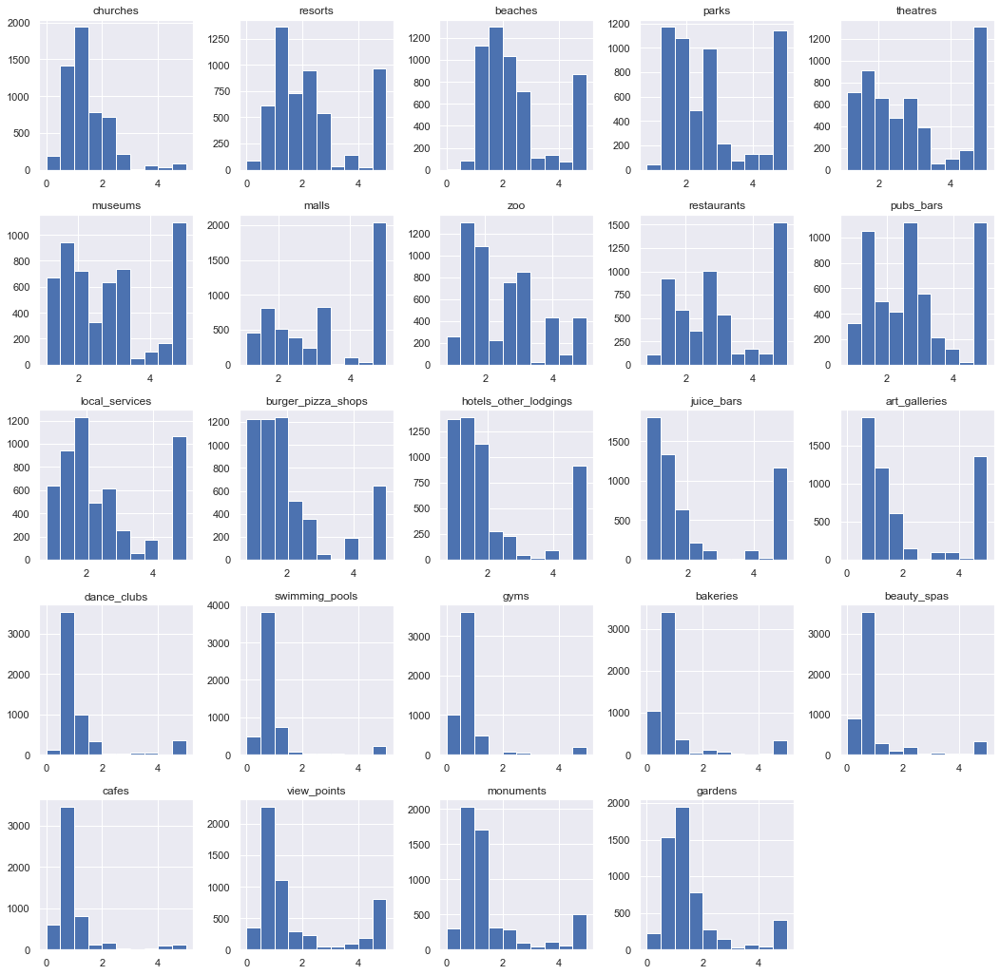

In [25]:
fig = data_no_missing.hist(figsize = (18,18))


**Lets check if users have rated all the features**

In [26]:
data_description = data_no_missing.describe() 
rated = data_description.loc['min'] > 0
rated[rated]


parks                    True
theatres                 True
museums                  True
malls                    True
zoo                      True
restaurants              True
pubs_bars                True
local_services           True
burger_pizza_shops       True
hotels_other_lodgings    True
juice_bars               True
Name: min, dtype: bool

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>The above 11 features have been given a rating by all the users as the minimum value is greater than 0
</b>
                </font>
            </div>
        </td>
    </tr>
</table>

Visualizing number of reviews for each category

In [54]:
data_no_missing[column_names[1:]].astype(bool).head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
0,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,False,False,False,False,False
1,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,False,False,False,False,False
2,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,False,False,False,False,False
3,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,False,False,False,False,False
4,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,False,True,False,False,False,False,False


In [56]:
## Sum of all columns (axis=0)
data_no_missing[column_names[1:]].astype(bool).sum(axis=1)

0       16
1       16
2       16
3       17
4       16
        ..
5451    24
5452    24
5453    24
5454    24
5455    24
Length: 5455, dtype: int64

In [57]:
## Sum of all rows (axis=0)
data_no_missing[column_names[1:]].astype(bool).sum(axis=0)

churches                 5260
resorts                  5365
beaches                  5451
parks                    5455
theatres                 5455
museums                  5455
malls                    5455
zoo                      5455
restaurants              5455
pubs_bars                5455
local_services           5455
burger_pizza_shops       5455
hotels_other_lodgings    5455
juice_bars               5455
art_galleries            5451
dance_clubs              5343
swimming_pools           4976
gyms                     4438
bakeries                 4409
beauty_spas              4559
cafes                    4851
view_points              5110
monuments                5153
gardens                  5230
dtype: int64

In [27]:
# Creating the dataframe containg number of review for each feature
reviews = data_no_missing[column_names[1:]].astype(bool).sum(axis=0).sort_values()
reviews

bakeries                 4409
gyms                     4438
beauty_spas              4559
cafes                    4851
swimming_pools           4976
view_points              5110
monuments                5153
gardens                  5230
churches                 5260
dance_clubs              5343
resorts                  5365
art_galleries            5451
beaches                  5451
pubs_bars                5455
local_services           5455
zoo                      5455
hotels_other_lodgings    5455
juice_bars               5455
malls                    5455
museums                  5455
theatres                 5455
parks                    5455
restaurants              5455
burger_pizza_shops       5455
dtype: int64

In [28]:
column_names = data_no_missing.columns.values

Text(0.5, 1.0, 'No of reviews under each category')

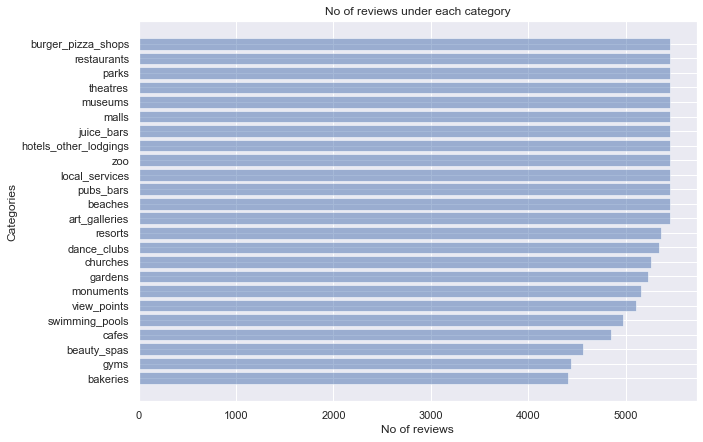

In [29]:
plt.figure(figsize=(10,7))
plt.barh(np.arange(len(column_names[1:])), reviews.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), reviews.index)
plt.xlabel('No of reviews')
plt.ylabel('Categories')
plt.title('No of reviews under each category')

**Now let's check how many users have given reviews to the features**

In [59]:
data_no_missing[column_names[1:]].astype(bool).sum(axis=1)

0       16
1       16
2       16
3       17
4       16
        ..
5451    24
5452    24
5453    24
5454    24
5455    24
Length: 5455, dtype: int64

In [30]:
# Creating a dataframe to store number of reviews by users
no_of_reviews = data_no_missing[column_names[1:]].astype(bool).sum(axis=1).value_counts()
no_of_reviews

24    3724
23     505
21     457
20     243
22     167
19     148
18     114
17      69
16      22
15       6
dtype: int64

Text(0.5, 1.0, 'No of Categories vs No of reviews')

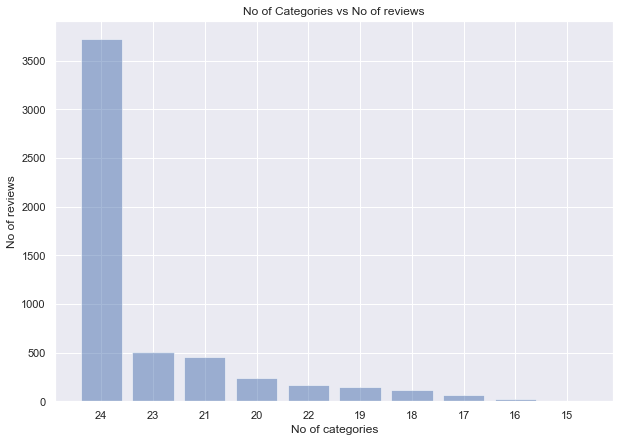

In [31]:
# Plotting the number of customers vs numbe of review
plt.figure(figsize=(10,7))
plt.bar(np.arange(len(no_of_reviews)), no_of_reviews.values, align='center', alpha=0.5)
plt.xticks(np.arange(len(no_of_reviews)), no_of_reviews.index)
plt.ylabel('No of reviews')
plt.xlabel('No of categories')
plt.title('No of Categories vs No of reviews')

**Conclusion**

Around 3500 users have given a rating for all the 24 categories and the least no of rating given by a user is 15. So for users with lesser number of ratings a recommender system can be built

**Now let's check Average rating per feature**

In [32]:
# Creating a dataframe to store average rating for each feature
avg_rating = data_no_missing[column_names[1:]].mean() # average rating is calculated by dividing count by it's mean
avg_rating = avg_rating.sort_values() # sorting the rating in increasing order
avg_rating

gyms                    0.822374
swimming_pools          0.949175
cafes                   0.965098
bakeries                0.969072
beauty_spas             0.999443
dance_clubs             1.192821
churches                1.455674
monuments               1.530818
gardens                 1.560570
view_points             1.749941
burger_pizza_shops      2.078339
hotels_other_lodgings   2.125747
juice_bars              2.190346
art_galleries           2.206060
resorts                 2.319824
beaches                 2.489520
zoo                     2.541047
local_services          2.550071
parks                   2.797192
pubs_bars               2.833093
museums                 2.893809
theatres                2.959278
restaurants             3.126301
malls                   3.351778
dtype: float64

Text(0.5, 1.0, 'Average rating per Category')

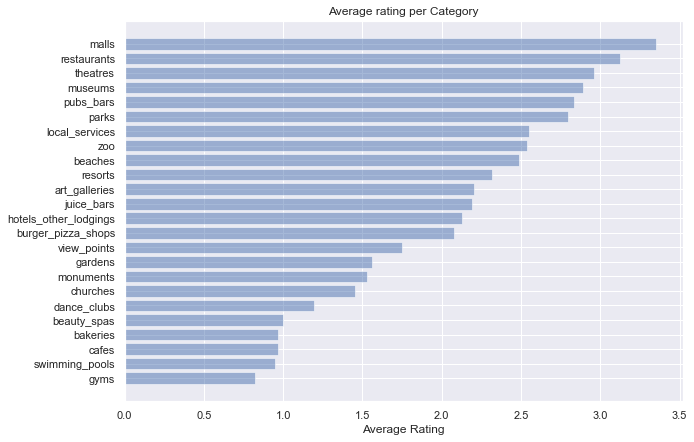

In [33]:
# Plotting average rating plots
plt.figure(figsize=(10,7))
plt.barh(np.arange(len(column_names[1:])), avg_rating.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), avg_rating.index)
plt.xlabel('Average Rating')
plt.title('Average rating per Category')

Creating a id column

In [34]:
data_1 = data_no_missing.copy()

new = data_1['user_id'].str.split(' ',n=2,expand=True)
data_1['user'] = new[0]
data_1['id'] = new[1]
data_1 = data_1.drop(['user_id','user'],axis=1)
data_1.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,1
1,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.640000,2.330000,2.650000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,2
2,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,3
3,0.000000,0.500000,3.630000,3.630000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.730000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,4
4,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,5


In [35]:
data_final = data_1.copy(deep = True)
data_final.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id
0,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,1
1,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.640000,2.330000,2.650000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,2
2,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,3
3,0.000000,0.500000,3.630000,3.630000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.730000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,4
4,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,5


<a id='Hierarchical_Clustering'></a>
## 8. Hierarchical Clustering

**import relevant packages**

In [36]:
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import scale as s
from scipy.cluster.hierarchy import dendrogram, linkage

In [61]:
data_final.shape

(5455, 25)

In [37]:
Z = sch.linkage(data_final,method='ward')
Z

array([[2.99000000e+02, 3.00000000e+02, 1.00005000e+00, 2.00000000e+00],
       [6.72000000e+02, 6.73000000e+02, 1.00005000e+00, 2.00000000e+00],
       [2.16000000e+03, 2.16100000e+03, 1.00005000e+00, 2.00000000e+00],
       ...,
       [1.09000000e+04, 1.09030000e+04, 3.22742555e+04, 2.06400000e+03],
       [1.09040000e+04, 1.09050000e+04, 6.91444681e+04, 3.39100000e+03],
       [1.09060000e+04, 1.09070000e+04, 1.38206963e+05, 5.45500000e+03]])

In [60]:
Z.shape

(5454, 4)

Text(0.5, 1.0, 'Hierarchical Clustering')

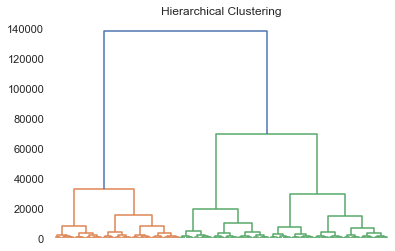

In [38]:
# Creating and plotting a dendogram
den = sch.dendrogram(Z)
plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,     
    top=False,         
    labelbottom=False) 
plt.title('Hierarchical Clustering')


Text(0.5, 1.0, 'Hierarchical Clustering')

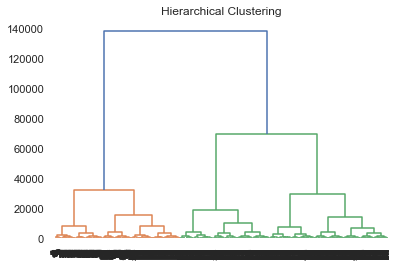

In [62]:
# Creating and plotting a dendogram
den = sch.dendrogram(Z)
plt.tick_params(
    axis='x',          
    which='minor',      
    bottom=False,     
    top=False,         
    labelbottom=False) 
plt.title('Hierarchical Clustering')


Text(0.5, 1.0, 'Hierarchical Clustering')

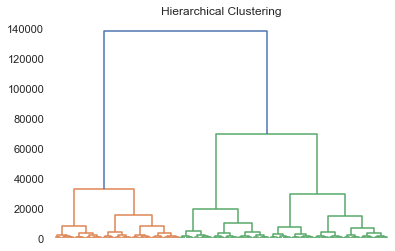

In [63]:
# Creating and plotting a dendogram
den = sch.dendrogram(Z)
plt.tick_params(
    axis='x',          
    which='major',      
    bottom=False,     
    top=False,         
    labelbottom=False) 
plt.title('Hierarchical Clustering')


### Components of a Dendrogram:

<img src="https://www.researchgate.net/profile/Vennan-Sibanda/publication/316877681/figure/fig1/AS:493103074287616@1494576342026/Dendrogram-of-part-families.png">

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>The number of clusters will be the number of vertical lines which are being intersected by the line drawn using the threshold. So we need to determine the cutting line.</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Creating a function to determine the cutting line**


In [39]:
def fd(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

**Creating a dendogram with cutting line**

Observing the height of each dendrogram division we decided to go with 80000 where the line would be drawn and 30000 to determine the dendrogram nodes

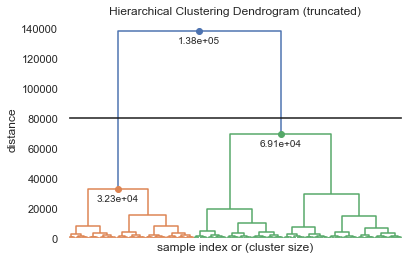

In [40]:
fd(Z,leaf_rotation=90.,show_contracted=True,annotate_above=30000,max_d=80000)
plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,     
    top=False,         
    labelbottom=False)

<table align='left'>
    <tr>
        <td width='8%'>
            <img src='note.png'>
        </td>
        <td>
            <div align='left', style='font-size:120%'>
                    <b>We can see that there are basically 2 clusters possible</b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Creating a hierarchical clustering model**

In [41]:
# Importing packages
from sklearn.cluster import AgglomerativeClustering 

In [42]:
# Creating a Agglomerative Clustering
hc_model = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage ='ward')

In [43]:
# Fitting the model
y_cluster = hc_model.fit_predict(data_final)

Adding the cluster column

In [44]:
data_clustered = data_final.copy()

In [45]:
data_clustered["Cluster"] = y_cluster.astype('object')

In [46]:
data_clustered.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id,Cluster
0,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,1,1
1,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.640000,2.330000,2.650000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,2,1
2,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,3,1
3,0.000000,0.500000,3.630000,3.630000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.730000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,4,1
4,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,5,1


**Visualizing the clusters**

In [47]:
cols = list(data_final.columns)
#cols.remove("user_id")
cols

['churches',
 'resorts',
 'beaches',
 'parks',
 'theatres',
 'museums',
 'malls',
 'zoo',
 'restaurants',
 'pubs_bars',
 'local_services',
 'burger_pizza_shops',
 'hotels_other_lodgings',
 'juice_bars',
 'art_galleries',
 'dance_clubs',
 'swimming_pools',
 'gyms',
 'bakeries',
 'beauty_spas',
 'cafes',
 'view_points',
 'monuments',
 'gardens',
 'id']

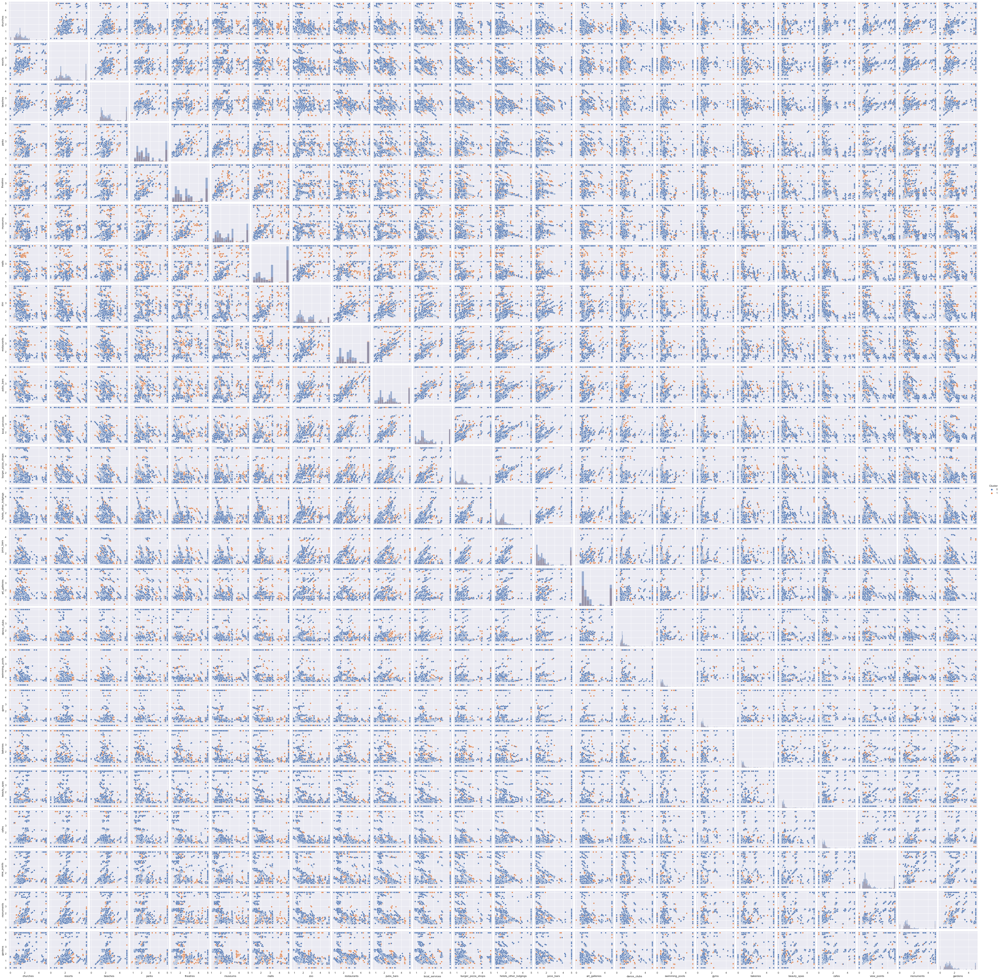

In [48]:
sns.pairplot(data_clustered, hue="Cluster", diag_kind="hist")

<a id='Conclusion'></a>
## 9. Conclusion

By using heirarchical clustering we clustered review into two category, positive review and a negeative review

In [49]:
result = data_clustered.copy()

In [50]:
result.replace({'Cluster' : 1} , 'Positive' , inplace=True)
result.replace({'Cluster' : 0} , 'Negeative' , inplace= True)

In [51]:
result.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,local_services,burger_pizza_shops,hotels_other_lodgings,juice_bars,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,id,Cluster
0,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,1,Positive
1,0.000000,0.000000,3.630000,3.650000,5.000000,2.920000,5.000000,2.640000,2.330000,2.650000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,2,Positive
2,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,3,Positive
3,0.000000,0.500000,3.630000,3.630000,5.000000,2.920000,5.000000,2.350000,2.330000,2.640000,1.730000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,4,Positive
4,0.000000,0.000000,3.630000,3.630000,5.000000,2.920000,5.000000,2.640000,2.330000,2.640000,1.700000,1.690000,1.700000,1.720000,1.740000,0.590000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,5,Positive
